In [1]:
!pip install segyio

In [3]:
import matplotlib.pyplot as plt
from scipy import signal
from math import sqrt, pi
import random
import numpy as np

import segyio
import lasio
from scipy import stats

from PIL import Image as im
from PIL import ImageEnhance as ie
from PIL import ImageFilter

### Determine the best seismic attribute for best pridicting of effective resevoir thickness

In [4]:
# Uploading data

# Seismic cube data
cubic = segyio.tools.cube('data/seis.sgy')

# Top of layer coordinates
top_layer = np.loadtxt('data/top.char', usecols=(2,5,6,7,8))
# 2 - Inline number, 5 - Cross-line number, 6 - Coordinate X , 7 - Coordinate Y, 8 - Coordinate t0

# Well data
well_data = np.loadtxt('data/ini_points_anon.txt')

 Average: 26.630177785714288 
 Median: 27.8366605 
 Dispersion: 99.7793571494116 
 Triple sigma: 29.966885296018074


Text(0.5, 1.0, 'Histogram of effective thickness')

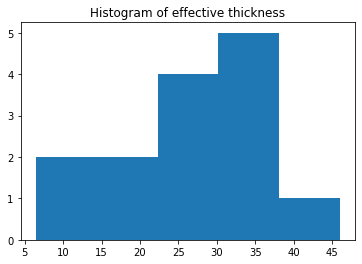

In [5]:
# Statistic research

well_x = well_data[:,0]
well_y = well_data[:, 1]
h_eff_pre = well_data[:, 2]

# Average, median values of effeсtive thickness, RMS and dispersion 

# At firt distribution is bimodal, for single-modal distribution we exclude all values less than 1 meter 
h_eff = []

for i in h_eff_pre:
    if i > 1:
        h_eff.append(i)

aver = np.mean(h_eff)
median = np.median(h_eff)
dispers = np.var(h_eff)

print(f' Average: {aver} \n Median: {median} \n Dispersion: {dispers} \n Triple sigma: {3 * sqrt(dispers)}')

# Histogram 

plt.hist(h_eff, bins=5)
plt.title("Histogram of effective thickness")

Assuming that the distribution is normal, we use the three sigma rule - the maximum reservoir thickness is 56.6 m. Let's say the wave speed is 2000 m/s, then the interval time is 28.3 ms - 14 samples with 2 ms of signal sampling; at 3000 m/ s, the interval time is 18.8 ms - 9 samples. We determine, as it were, the width of the zone of influence, and, accordingly, the size of the windows for calculations.

In [16]:
# Getting horison out of cube
# Ndarray of cube consists of amplitudes values (time samples) 
# Ndarray of layer (inline X xline X xcoord X ycoord X time)

print(type(cubic))
print(type(top_layer))
print(cubic.shape)
print(top_layer.shape)

# Reflecting horison in the cube (known a priori)
finl = 479 # Number of first inline 
fcrl = 5000 # Number of first xline
tmin = 1750 # Time of first horison sample
tinc = 2 # Time sampling step

ninl = np.rint(top_layer[:,0]-finl).astype(np.int64) # Array with inline numbers
ncrl = np.rint(top_layer[:,1]-fcrl).astype(np.int64) # Array with xline numbers

coord_x = top_layer[:,2]
coord_y = top_layer[:,3]

t_hor_top = (top_layer[:,4]-tmin)/tinc

horizon_top = np.zeros((cubic.shape[0],cubic.shape[1])) 
mask = np.zeros((cubic.shape[0],cubic.shape[1])) 

horizon_top[ninl[:],ncrl[:]] = t_hor_top[:].copy()
mask[ninl[:],ncrl[:]] = 1

print(horizon_top.shape)
print(horizon_top_coord.shape)


<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
(1022, 644, 76)
(511914, 5)
(1022, 644)
(1022, 644)


In [113]:
# Function returns map of amplitudes
def amplitudes_map(cube, horison, inline_ar, crossline_ar, step_down_from_top):
    amplitudes = np.zeros((cube.shape[0], cube.shape[1]))
    amplitudes[inline_ar[:], crossline_ar[:]] = cubic[inline_ar[:], crossline_ar[:], 
                                                      horison[inline_ar[:], crossline_ar[:]].astype(np.int64) 
                                                      + step_down_from_top ]
    return amplitudes

# Map of amplitudes along the layer top
amp_map = amplitudes_map(cubic, horizon_top, ninl, ncrl, 0)

def multiplied_amp(cube, horison, inline_ar, crossline_ar, numbers_of_step_down):
    m_amplitudess = np.zeros((cube.shape[0], cube.shape[1])) + 1
    for i in range(numbers_of_step_down):
        m_amplitudess *= amplitudes_map(cubic, horizon_top, ninl, ncrl, i) / 10e2
    return m_amplitudess
    
    
def multiplied_module_amp(cube, horison, inline_ar, crossline_ar, numbers_of_step_down):
    m_amplitudes =np.zeros((cube.shape[0], cube.shape[1])) + 1
    for i in range(numbers_of_step_down):
        m_amplitudes *= np.abs(amplitudes_map(cubic, horizon_top, ninl, ncrl, i)) / 10e2
    return m_amplitudes
    


In [89]:
def summ_amp(cube, horison, inline_ar, crossline_ar, numbers_of_step_down):
    m_amplitudes = np.zeros((cube.shape[0], cube.shape[1]))
    for i in range(numbers_of_step_down):
        m_amplitudes += amplitudes_map(cubic, horizon_top, ninl, ncrl, i)
    return m_amplitudes
    
def summ_module_amp(cube, horison, inline_ar, crossline_ar, numbers_of_step_down):
    m_amplitudes = np.zeros((cube.shape[0], cube.shape[1]))
    for i in range(numbers_of_step_down):
        m_amplitudes += np.abs(amplitudes_map(cubic, horizon_top, ninl, ncrl, i))
    return m_amplitudes

In [90]:
amplitudes = amplitudes_map(cubic, horizon_top, ninl, ncrl, 0)

summ_amplitudes = summ_amp(cubic, horizon_top, ninl, ncrl, 14)
summ_module_amplitudes = summ_module_amp(cubic, horizon_top, ninl, ncrl, 14)

In [114]:
multiplied_amplitudes = multiplied_amp(cubic, horizon_top, ninl, ncrl, 14)
multiplied_module_amplitudes = multiplied_module_amp(cubic, horizon_top, ninl, ncrl, 14)

In [80]:
from scipy.signal import hilbert

In [50]:
# Hilbert transform for whole cube

# fs - sampling frequency

def hilbert_transform(cube, fs=500):
    amplitude_envelope = np.zeros(cube.shape)
    instantaneous_phase = np.zeros(cube.shape)
    instantaneous_frequency = np.zeros(cube.shape)
    sweetness = np.zeros(cube.shape)
    
    for i in range(cube.shape[0]):
        for j in range(cube.shape[1]):
            trace = cube[i,j,:]
            analytic_signal = hilbert(trace)
            amplitude_envelope[i,j,:] = np.abs(analytic_signal)
            instantaneous_phase[i,j,:] = np.angle(analytic_signal) * 180/np.pi
            
            instantaneous_frequency[i,j,:-1] = np.diff(np.unwrap(np.angle(analytic_signal))) * fs/(2*np.pi)
            sweetness[i,j,:] = amplitude_envelope[i,j,:]/(abs(instantaneous_frequency[i,j,:])+10e-5)**0.5 
            # 10e-5 - avoiding division by 0
            
    
    return amplitude_envelope, instantaneous_phase, instantaneous_frequency, sweetness

In [52]:
amplitude_envelope, instantaneous_phase, instantaneous_frequency, sweetness = hilbert_transform(cubic, fs=500)

In [ ]:
# Cut parameter off the cube
amp_envelope = amplitudes_map(amplitude_envelope, horizon_top, ninl, ncrl, 0)
inst_phase = amplitudes_map(instantaneous_phase, horizon_top, ninl, ncrl, 0)
inst_freq = amplitudes_map(instantaneous_frequency, horizon_top, ninl, ncrl, 0)
sweet = amplitudes_map(sweetness, horizon_top, ninl, ncrl, 0)

In [258]:

# Number of samples and time before first maximum after top-layer
def first_peak(cube, horison, inline_ar, crossline_ar):
    first_pk = np.zeros((cube.shape[0], cube.shape[1]))

    print(inline_ar[:], crossline_ar[:])
    
    trace_last_index = int(len(cubic[inline_ar[0], crossline_ar[0], :]) - 1)
    
    for i in range(0, 511914):
                x = True
                time_sample_step = 1
                #print(inline_ar[i], crossline_ar[j])
                while x:
                    time_sample_step += 1
                    
                    sample_num = int(horison[inline_ar[i], crossline_ar[i]].astype(np.int64) + time_sample_step)
                
                    if sample_num + 1 > trace_last_index:
                        break
                    else:
                        a = cubic[inline_ar[i], crossline_ar[i], sample_num]
                        b = cubic[inline_ar[i], crossline_ar[i], sample_num + 1]
                        c = cubic[inline_ar[i], crossline_ar[i], sample_num - 1]

                        if b < a and c < a:
                            
                            first_pk[inline_ar[i], crossline_ar[i]] = time_sample_step
                            break
    return first_pk
# Number of samples and time before first minimum after top-layer

def first_dip(cube, horison, inline_ar, crossline_ar):
    first_dp = np.zeros((cube.shape[0], cube.shape[1]))

    print(inline_ar[:], crossline_ar[:])
    
    trace_last_index = int(len(cubic[inline_ar[0], crossline_ar[0], :]) - 1)
    
    for i in range(0, 511914):
                x = True
                time_sample_step = 1
                #print(inline_ar[i], crossline_ar[j])
                while x:
                    time_sample_step += 1
                    
                    sample_num = int(horison[inline_ar[i], crossline_ar[i]].astype(np.int64) + time_sample_step)
                
                    if sample_num + 1 > trace_last_index:
                        break
                    else:
                        a = cubic[inline_ar[i], crossline_ar[i], sample_num]
                        b = cubic[inline_ar[i], crossline_ar[i], sample_num + 1]
                        c = cubic[inline_ar[i], crossline_ar[i], sample_num - 1]

                        if b > a and c > a:
                            
                            first_dp[inline_ar[i], crossline_ar[i]] = time_sample_step
                            break
                                                
    return first_dp


In [259]:
#ninl.shape
ncrl.shape

(511914,)

In [260]:
first_dip_delay = first_dip(cubic, horizon_top, ninl, ncrl)

[  27   27   27 ... 1020 1020 1020] [339 340 341 ... 502 503 504]


In [261]:
first_dip_delay.shape

(1022, 644)

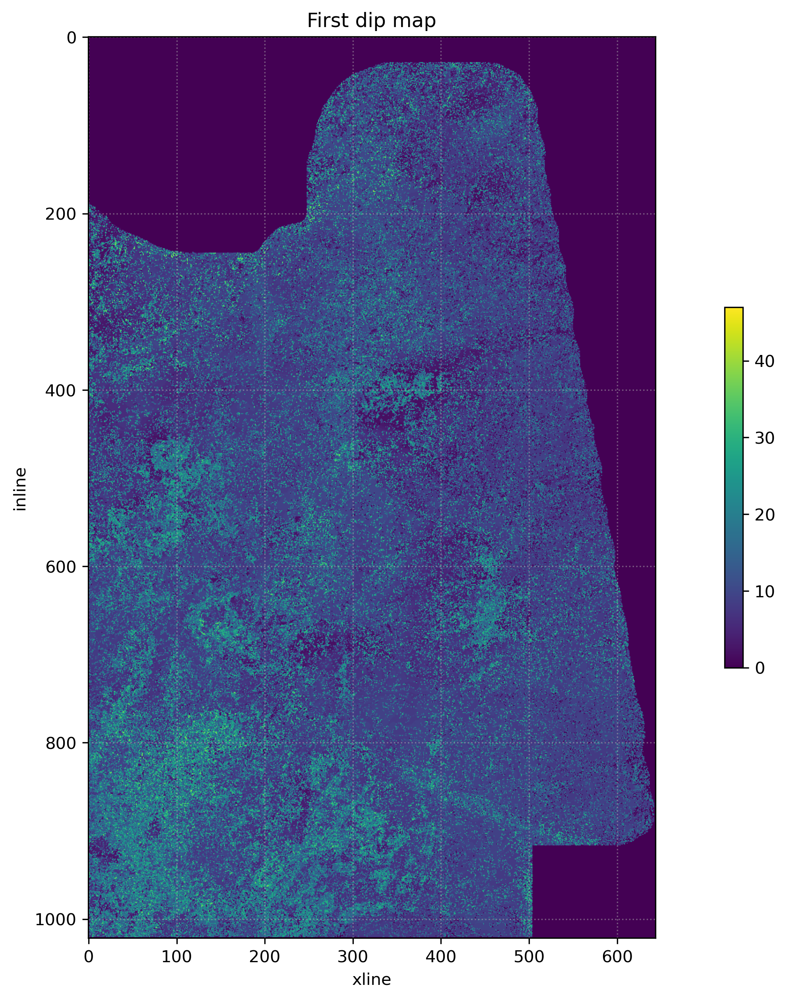

In [262]:
plt.figure(figsize=(15, 10), dpi=300)
plt.imshow(first_dip_delay)
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('First dip map')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)


In [145]:
cubic.shape

(1022, 644, 76)

In [213]:
for i in range(1000):
    if first_dip_delay[i, 400] > 0:
        print(i)

30
32
33


So, we've got 11 maps of attributes. Later we should create more. 

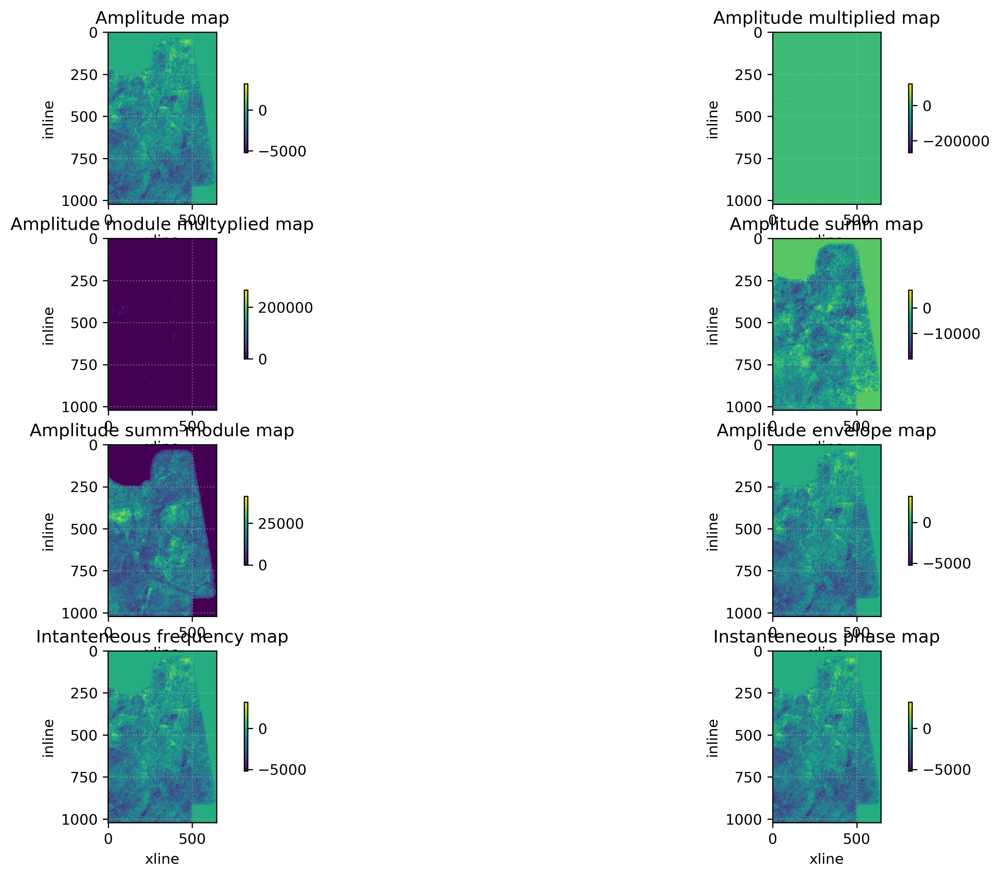

In [119]:


plt.figure(figsize=(15, 10), dpi=300)

# Amplitude map

plt.subplot(421)
plt.imshow(amplitudes) # итоговая синтетическая сейсмика
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('Amplitude map')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)

# Amplitude multiplied map

plt.subplot(422)
plt.imshow(multiplied_amplitudes) # итоговая синтетическая сейсмика
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('Amplitude multiplied map')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)

# Amplitude module multiplied map

plt.subplot(423)
plt.imshow(multiplied_module_amplitudes) # итоговая синтетическая сейсмика
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('Amplitude module multyplied map')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)

# Amplitude summ map

plt.subplot(424)
plt.imshow(summ_amplitudes) # итоговая синтетическая сейсмика
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('Amplitude summ map')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)

# Amplitude module summ map

plt.subplot(425)
plt.imshow(summ_module_amplitudes) # итоговая синтетическая сейсмика
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('Amplitude summ module map')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)


# Amplitude envelope map

plt.subplot(426)
plt.imshow(amp_envelope) # итоговая синтетическая сейсмика
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('Amplitude envelope map')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)

# Intanteneous frequency map

plt.subplot(427)
plt.imshow(inst_freq) # итоговая синтетическая сейсмика
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('Intanteneous frequency map')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)

# Instanteneous phase map

plt.subplot(428)
plt.imshow(inst_phase) # итоговая синтетическая сейсмика
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('Instanteneous phase map')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)


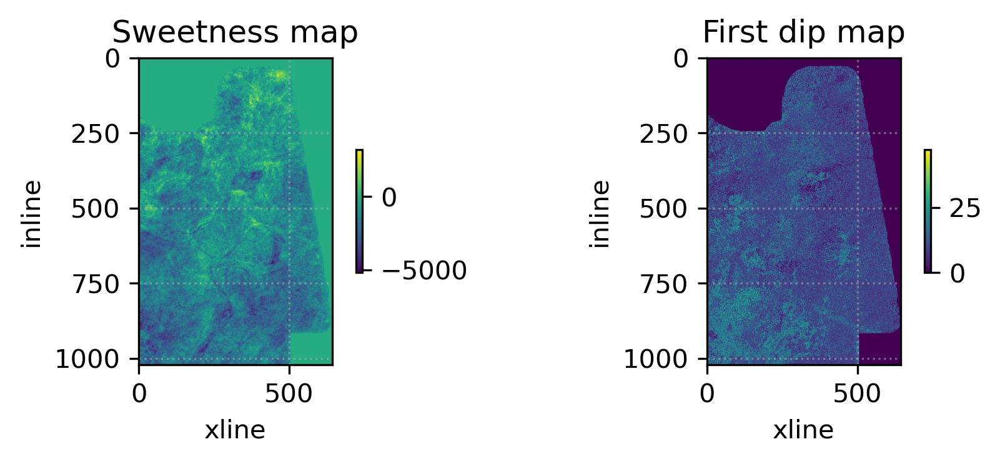

In [264]:
plt.figure(figsize=(15, 10), dpi=300)
# Sweetness map
plt.subplot(441)
plt.imshow(sweet)
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('Sweetness map')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)

# First dip map

plt.subplot(442)
plt.imshow(first_dip_delay)
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('First dip map')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)


# Visualization of attributes map

In [307]:
ninl = np.rint(top_layer[:,0]-finl).astype(np.int64) # Array with inline numbers
ncrl = np.rint(top_layer[:,1]-fcrl).astype(np.int64) # Array with xline numbers

coord_x = top_layer[:,2]
coord_y = top_layer[:,3]


def get_attr(x, y, att_map):
    dif_x = []
    for i in coord_x:
        dif = abs(x - i)
        dif_x.append(dif)
    dif_y = []
    for j in coord_y:
        dif = abs(y - j)
        dif_y.append(dif)
    summ_xy = list(map(lambda q, w: q + w, dif_x, dif_y))
    #print(min(summ_xy))
    ind = summ_xy.index(min(summ_xy))
    #print(x, y)
    #print(top_layer[ind, 2], top_layer[ind, 3])
    inline = int(top_layer[ind, 0]-finl) 
    xline = int(top_layer[ind, 1]-fcrl)
    return att_map[inline, xline]
   

def corr_and_map(attribute_map):
    well_x = well_data[:,0]
    well_y = well_data[:, 1]
    h_eff_pre = well_data[:, 2]
    attribute_values = []
    for i in range(len(well_x)):
        prm = get_attr(well_x[i], well_y[i], attribute_map)
        attribute_values.append(prm)
    slope, intercept, rvalue = stats.linregress(attribute_values, h_eff_pre)[0:3]    
    print(f'Correlation coefficient: {rvalue}')
    return slope, intercept, rvalue
    

In [308]:
attributes_map_list = [ amplitudes, multiplied_amplitudes, multiplied_module_amplitudes, summ_amplitudes, 
summ_module_amplitudes, amp_envelope, inst_freq, inst_phase, sweet, first_dip_delay ]

for i in attributes_map_list:
    corr_and_map(i)

Correlation coefficient: 0.207749795787781
Correlation coefficient: -0.5366097307878538
Correlation coefficient: 0.5363228059252159
Correlation coefficient: -0.763938691170934
Correlation coefficient: 0.8495374990255898
Correlation coefficient: 0.207749795787781
Correlation coefficient: 0.207749795787781
Correlation coefficient: 0.207749795787781
Correlation coefficient: 0.207749795787781
Correlation coefficient: -0.2390767304656561


Amplitude envelope is the best parameter according to to correlation coefficient

Correlation coefficient: 0.207749795787781


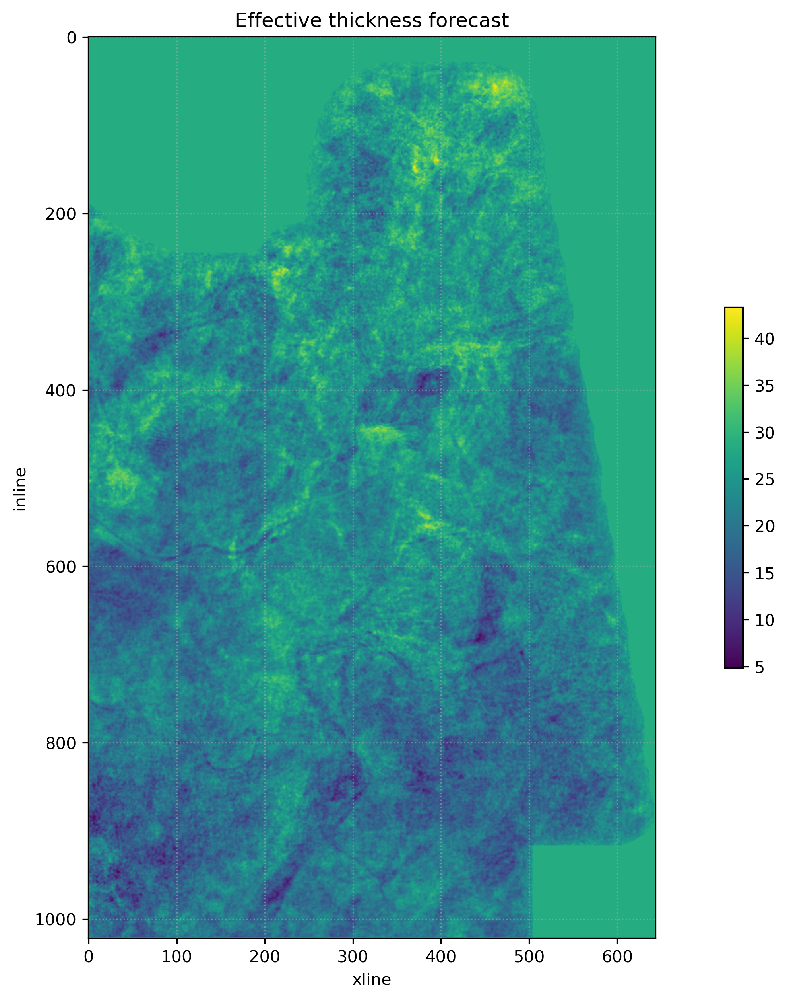

In [312]:
slope, intercept, rvalue = corr_and_map(amp_envelope)

h_eff = amp_envelope * slope + intercept

plt.figure(figsize=(15, 10), dpi=300)
plt.imshow(h_eff)
plt.xlabel('xline')
plt.ylabel('inline')
plt.title('Effective thickness forecast')
plt.grid(ls=':',alpha=.5)
plt.colorbar(shrink=0.4)

### Calculation of coherence parameters

In [316]:
# To be continued. . .